# Import Libraries  

In [84]:
import pandas as pd
import numpy as np
from sklearn import metrics
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 



from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
#rom IPython.display import Image  
from sklearn import tree
from os import system

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, recall_score, precision_score, f1_score, roc_auc_score,accuracy_score, classification_report


# Import Data  

In [85]:
data = pd.read_csv('bank-full.csv')

# Univariate analysis (12 marks)

a. Univariate analysis – data types and description of the independent attributes which should include (name, meaning, range of values observed, central values (mean and median), standard deviation and quartiles, analysis of the body of distributions / tails, missing values, outliers.

b. Strategies to address the different data challenges such as data pollution, outlier’s treatment and missing values treatment.

c. Please provide comments in jupyter notebook regarding the steps you take and insights drawn from the plots.

In [86]:
data.head(10)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
5,35,management,married,tertiary,no,231,yes,no,unknown,5,may,139,1,-1,0,unknown,no
6,28,management,single,tertiary,no,447,yes,yes,unknown,5,may,217,1,-1,0,unknown,no
7,42,entrepreneur,divorced,tertiary,yes,2,yes,no,unknown,5,may,380,1,-1,0,unknown,no
8,58,retired,married,primary,no,121,yes,no,unknown,5,may,50,1,-1,0,unknown,no
9,43,technician,single,secondary,no,593,yes,no,unknown,5,may,55,1,-1,0,unknown,no


In [87]:
# datatype
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
age          45211 non-null int64
job          45211 non-null object
marital      45211 non-null object
education    45211 non-null object
default      45211 non-null object
balance      45211 non-null int64
housing      45211 non-null object
loan         45211 non-null object
contact      45211 non-null object
day          45211 non-null int64
month        45211 non-null object
duration     45211 non-null int64
campaign     45211 non-null int64
pdays        45211 non-null int64
previous     45211 non-null int64
poutcome     45211 non-null object
Target       45211 non-null object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [88]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.936210,10.618762,18.0,33.0,39.0,48.0,95.0
balance,45211.0,1362.272058,3044.765829,-8019.0,72.0,448.0,1428.0,102127.0
day,45211.0,15.806419,8.322476,1.0,8.0,16.0,21.0,31.0
duration,45211.0,258.163080,257.527812,0.0,103.0,180.0,319.0,4918.0
campaign,45211.0,2.763841,3.098021,1.0,1.0,2.0,3.0,63.0
pdays,45211.0,40.197828,100.128746,-1.0,-1.0,-1.0,-1.0,871.0
previous,45211.0,0.580323,2.303441,0.0,0.0,0.0,0.0,275.0


In [89]:
data.shape

(45211, 17)

In [90]:
data.nunique()

age            77
job            12
marital         3
education       4
default         2
balance      7168
housing         2
loan            2
contact         3
day            31
month          12
duration     1573
campaign       48
pdays         559
previous       41
poutcome        4
Target          2
dtype: int64

In [91]:
# Values counts of categorical variables to find incorrect data 
cat_columns = ['job','marital', 'education', 'default','housing', 'loan','contact','poutcome','Target','previous']
for i in cat_columns:
    x = data[i].value_counts()
    print(i)
    print(x)
    print("")
    


job
blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64

marital
married     27214
single      12790
divorced     5207
Name: marital, dtype: int64

education
secondary    23202
tertiary     13301
primary       6851
unknown       1857
Name: education, dtype: int64

default
no     44396
yes      815
Name: default, dtype: int64

housing
yes    25130
no     20081
Name: housing, dtype: int64

loan
no     37967
yes     7244
Name: loan, dtype: int64

contact
cellular     29285
unknown      13020
telephone     2906
Name: contact, dtype: int64

poutcome
unknown    36959
failure     4901
other       1840
success     1511
Name: poutcome, dtype: int64

Target
no     39922
yes     5289
Name: Target, dtype: int64

previous
0      36954
1       2772
2       2106
3     

 # Observations
 1. Many unknown values and job, education and contact
 2. "previous" column has 36954 as 0. No contact is made before this compaign. 

In [92]:
#Univariate 
from pandas_profiling import ProfileReport
ProfileReport(data)

C:\Users\dpandharkar\Anaconda3\lib\site-packages\pandas_profiling\describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,17
Number of observations,45211
Total Missing (%),0.0%
Total size in memory,5.9 MiB
Average record size in memory,136.0 B
Numeric,7
Categorical,10
Boolean,0
Date,0
Text (Unique),0
Rejected,0


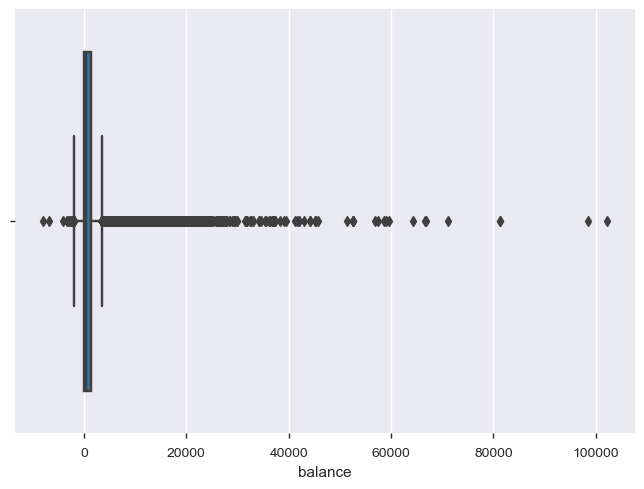

In [93]:
sns.boxplot(data['balance'])

In [94]:
# from data summary, ProfileReport and above plot, balance has outliers
# balance0	
#(mean)1362.272058 
#(min)-8019.0
#(max) 102127.0
from scipy.stats import zscore
balance_outliers =  zscore(data['balance'])
print(balance_outliers)




[ 0.25641925 -0.43789469 -0.44676247 ...  1.42959305 -0.22802402
  0.52836436]


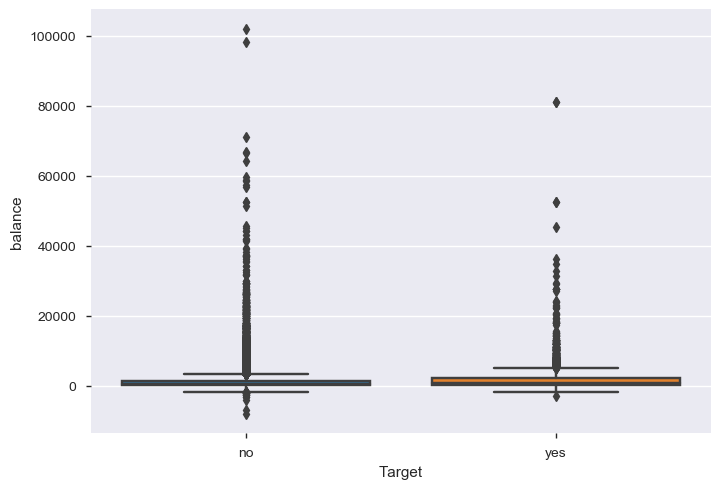

In [95]:
sns.boxplot(data['Target'],data['balance'])

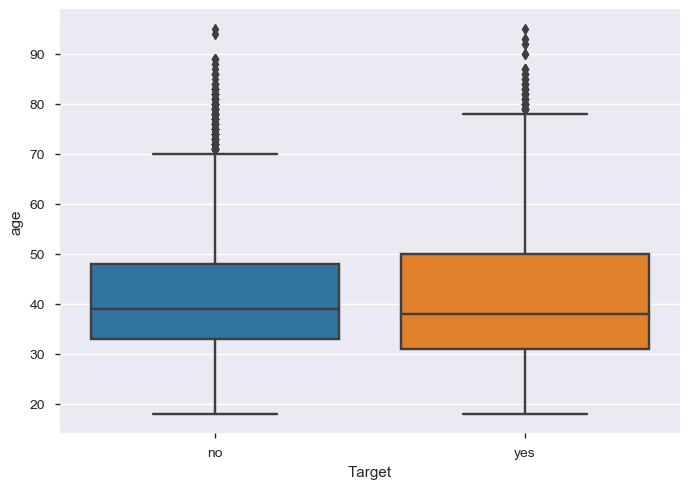

In [96]:
sns.boxplot(data['Target'],data['age'])

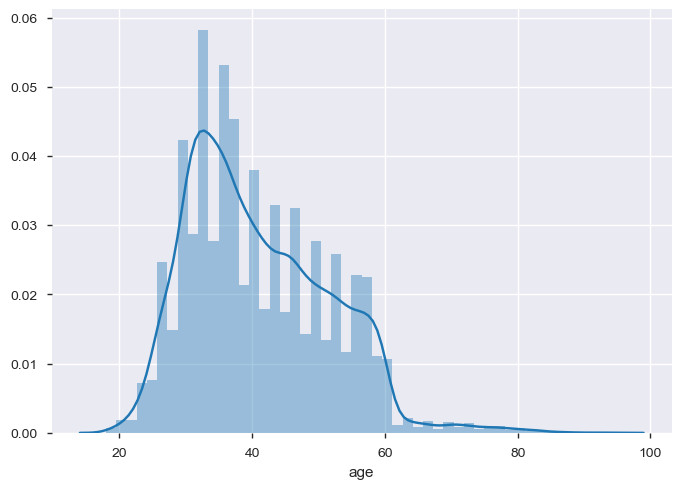

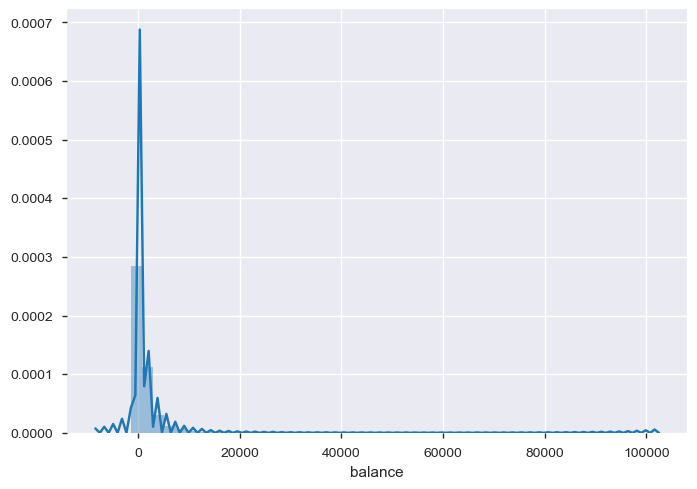

In [97]:
for i in ['age','balance']:
    sns.distplot(data[i])
    plt.show()

In [98]:
#null values 
data.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
Target       0
dtype: int64

In [99]:
# incorrect imputation
data.isna().values.any()

False

# Incorrect values 

There is no missing value in this dataset. There are values like “unknown”, “others”.

From above analysis, we know that 
1. job column has 288 'unknown' values
2. education column has 1857 'unknown' values
3. contact column has 13020 'unknown' values
4. poutcome column has 36959 'unknown' values and 1840 'other' values


# Multivariate analysis (8 marks)

a. Bi-variate analysis between the predictor variables and target column. Comment on your findings in terms of their relationship and degree of relation if any. Visualize the analysis using boxplots and pair plots, histograms or density curves. Select the most appropriate attributes.

b. Please provide comments in jupyter notebook regarding the steps you take and insights drawn from the plots

In [100]:
data["Target_Int"] = data["Target"].apply(lambda x: 0 if x == 'no' else 1)
data.head(10)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target,Target_Int
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no,0
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no,0
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no,0
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no,0
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no,0
5,35,management,married,tertiary,no,231,yes,no,unknown,5,may,139,1,-1,0,unknown,no,0
6,28,management,single,tertiary,no,447,yes,yes,unknown,5,may,217,1,-1,0,unknown,no,0
7,42,entrepreneur,divorced,tertiary,yes,2,yes,no,unknown,5,may,380,1,-1,0,unknown,no,0
8,58,retired,married,primary,no,121,yes,no,unknown,5,may,50,1,-1,0,unknown,no,0
9,43,technician,single,secondary,no,593,yes,no,unknown,5,may,55,1,-1,0,unknown,no,0


In [101]:
corr = data.corr()

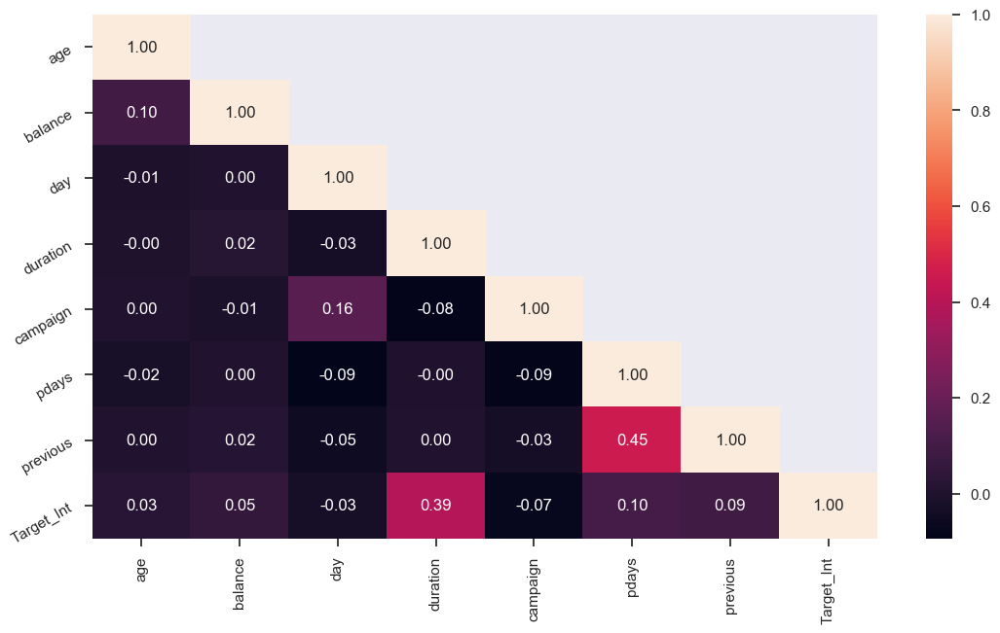

In [102]:
sns.set_context("notebook", font_scale=1.0, rc={"lines.linewidth": 2.5})
plt.figure(figsize=(13,7))
# create a mask so we only see the correlation values once
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask, 1)] = True
a = sns.heatmap(corr,mask=mask, annot=True, fmt='.2f')
rotx = a.set_xticklabels(a.get_xticklabels(), rotation=90)
roty = a.set_yticklabels(a.get_yticklabels(), rotation=30)

# Target has relatively strong relation with duration

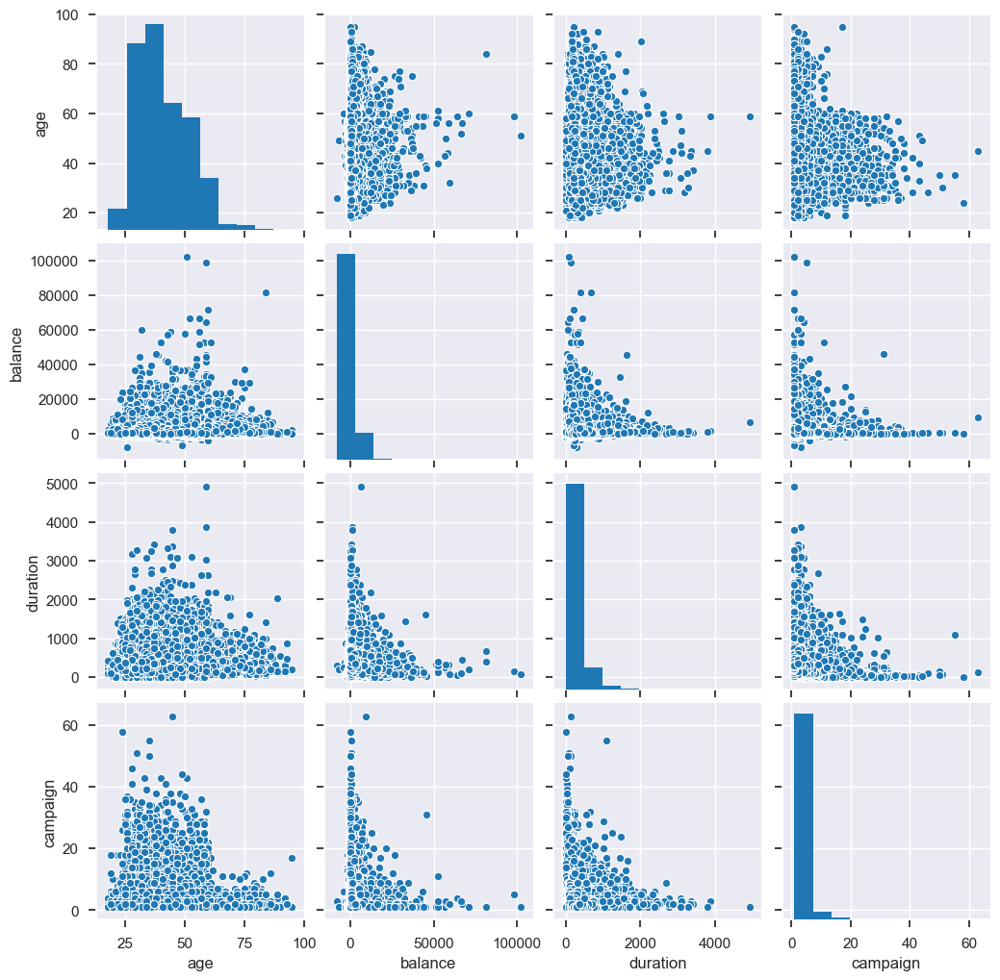

In [103]:
sns.pairplot(data[['age','balance','duration','campaign']]);

# Deliverable – 2 (Prepare the data for analytics) – (10)

1. Ensure the attribute types are correct. If not, take appropriate actions.
2. Get the data model ready.
3. Transform the data i.e. scale / normalize if required
4. Create the training set and test set in ratio of 70:30


In [104]:
# Handle incorrect values
data[['poutcome']] = data[['poutcome']].replace(['other'],'unknown')

In [105]:
# Drop columns which do not have any impact
newData = data.drop('contact',axis = 1)
newData = newData.drop('marital',axis = 1)
newData = newData.drop('Target',axis = 1)
#newData = data
newData.head()

,age,job,education,default,balance,housing,loan,day,month,duration,campaign,pdays,previous,poutcome,Target_Int
0,58,management,tertiary,no,2143,yes,no,5,may,261,1,-1,0,unknown,0
1,44,technician,secondary,no,29,yes,no,5,may,151,1,-1,0,unknown,0
2,33,entrepreneur,secondary,no,2,yes,yes,5,may,76,1,-1,0,unknown,0
3,47,blue-collar,unknown,no,1506,yes,no,5,may,92,1,-1,0,unknown,0
4,33,unknown,unknown,no,1,no,no,5,may,198,1,-1,0,unknown,0


In [106]:
newData.shape

(45211, 15)

In [107]:
# Drop outliers 
condition1 = (balance_outliers >3) | (balance_outliers <-3 )
newData = newData.drop(newData[condition1].index, axis = 0, inplace = False)

In [108]:
newData.shape

(44466, 15)

In [109]:
X = newData.drop('Target_Int',axis=1)    
Y = newData['Target_Int']  

In [110]:
# OnehotEncoding
X = pd.get_dummies(X, drop_first=True)

In [111]:
X.columns

Index(['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous',
       'job_blue-collar', 'job_entrepreneur', 'job_housemaid',
       'job_management', 'job_retired', 'job_self-employed', 'job_services',
       'job_student', 'job_technician', 'job_unemployed', 'job_unknown',
       'education_secondary', 'education_tertiary', 'education_unknown',
       'default_yes', 'housing_yes', 'loan_yes', 'month_aug', 'month_dec',
       'month_feb', 'month_jan', 'month_jul', 'month_jun', 'month_mar',
       'month_may', 'month_nov', 'month_oct', 'month_sep', 'poutcome_success',
       'poutcome_unknown'],
      dtype='object')

In [112]:
#Create the training set and test set in ratio of 70:30
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1)

In [113]:
print("Total records: ", len(newData.index))
print("Training records: ", len(x_train))
print("Testing records: ",len(x_test))

Total records:  44466
Training records:  31126
Testing records:  13340


In [114]:
print("{0:0.2f}% data is in training set".format((len(x_train)/len(newData.index)) * 100))
print("{0:0.2f}% data is in test set".format((len(x_test)/len(newData.index)) * 100))

70.00% data is in training set
30.00% data is in test set


In [115]:
pos = y_train[y_train == 1].count()
neg = y_train[y_train == 0].count()
print("Positive = ", pos)
print("Negative = ", neg)
perc = pos/len(y_train)
print(perc)


Positive =  3569
Negative =  27557
0.11466298271541477


In [116]:
pos = y_test[y_test == 1].count()
neg = y_test[y_test == 0].count()
print("Positive = ", pos)
print("Negative = ", neg)
perc = pos/len(y_test)
print(perc)

Positive =  1599
Negative =  11741
0.11986506746626686


# Deliverable – 3 (create the ensemble model) – (30)

1. First create models using Logistic Regression and Decision Tree algorithm. Note the model performance by using different matrices. Use confusion matrix to evaluate class level metrics i.e. Precision/Recall. Also reflect the accuracy and F1 score of the model. (10 marks)
2. Build the ensemble models (Bagging and Boosting) and note the model performance by using different matrices. Use same metrics as in above model. (at least 3 algorithms) (15 marks)
3. Make a DataFrame to compare models and their metrics. Give conclusion regarding the best algorithm and your reason behind it. (5 marks)

In [117]:
def draw_cm( actual, predicted ):
    cm = metrics.confusion_matrix( actual, predicted)
    sns.heatmap(cm, annot=True,fmt='.2f', xticklabels = [0,1] , yticklabels = [0,1] )
    plt.ylabel('Observed')
    plt.xlabel('Predicted')
    plt.show()

In [118]:
algo_names=[]
train_scores=[]
test_scores=[]
recall_scores =[]
precision_scores = []
f1_scores =[]
roc_auc_scores = []

In [119]:
def PrintMetrics(name,model, predicted):
    algo_names.append(name)
    train_score = model.score(x_train, y_train)
    train_scores.append(train_score)
    print("Training accuracy :",train_score) 
    print()
    test_score = round(model.score(x_test, y_test),3)
    test_scores.append(test_score)
    print("Testing accuracy:",test_score)
    print()
    print('Confusion Matrix')
    print(draw_cm(y_test,predicted))
    print()
    recall = recall_score(y_test,predicted)
    recall_scores.append(recall)
    print("Recall:",recall)
    print()
    precision = precision_score(y_test,predicted)
    precision_scores.append(precision)
    print("Precision:",precision)
    print()
    f1Value =f1_score(y_test,predicted)
    f1_scores.append(f1Value)
    print("F1 Score:",f1Value)
    print()
    roc = roc_auc_score(y_test,predicted)
    roc_auc_scores.append(roc)
    print("Roc Auc Score:",roc)
    print()
    print("Classification Report:")
    print(classification_report(y_test,predicted))

In [120]:
#Logistic Regression

#solver = ['newton-cg','lbfgs','liblinear','sag','saga']

#for i in solver:
logModel = LogisticRegression()  # changing values of solver
logModel.fit(x_train, y_train) 
y_predict = logModel.predict(x_test)     
coef_df = pd.DataFrame(logModel.coef_)
coef_df['intercept'] = logModel.intercept_
print(coef_df)

          0         1         2         3        4       5         6  \
0 -0.021721  0.000059 -0.004884  0.003797 -0.33238  0.0024 -0.192775   

          7         8         9  ...        28        29        30        31  \
0 -0.333754 -0.034525 -0.006296  ... -0.107359 -0.086414  0.114342 -0.540235   

         32        33        34        35        36  intercept  
0 -0.067503  0.134725  0.106193  0.402225 -0.570665  -0.366169  

[1 rows x 38 columns]


C:\Users\dpandharkar\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression Metrics:

Training accuracy : 0.8931118678917946

Testing accuracy: 0.891

Confusion Matrix


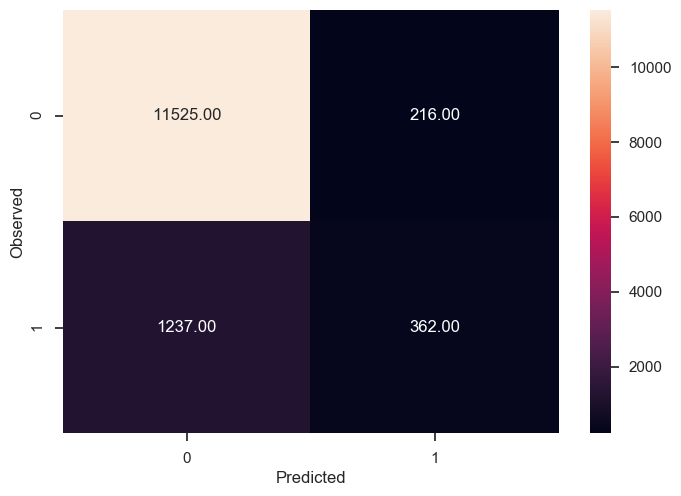

None

Recall: 0.2263914946841776

Precision: 0.6262975778546713

F1 Score: 0.3325677537896187

Roc Auc Score: 0.6039972122939669

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.98      0.94     11741
           1       0.63      0.23      0.33      1599

    accuracy                           0.89     13340
   macro avg       0.76      0.60      0.64     13340
weighted avg       0.87      0.89      0.87     13340



In [121]:
print('LogisticRegression Metrics:')
print()
PrintMetrics('LogisticRegression',logModel,y_predict)

In [122]:
#Decision Tree algorithm
dTree = DecisionTreeClassifier(criterion = 'entropy')
dTree.fit(x_train, y_train)
dTreePredict = dTree.predict(x_test)  

Decision Tree Metrics:

Training accuracy : 1.0

Testing accuracy: 0.871

Confusion Matrix


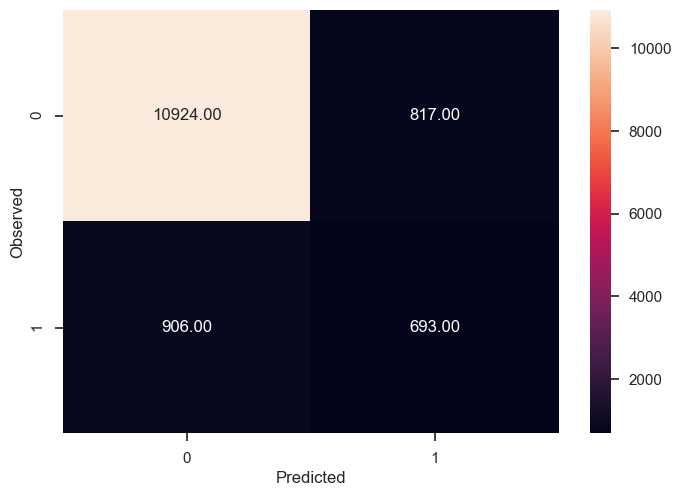

None

Recall: 0.4333958724202627

Precision: 0.4589403973509934

F1 Score: 0.44580250884528794

Roc Auc Score: 0.6819053291068182

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.93      0.93     11741
           1       0.46      0.43      0.45      1599

    accuracy                           0.87     13340
   macro avg       0.69      0.68      0.69     13340
weighted avg       0.87      0.87      0.87     13340



In [123]:
#Decision Tree metrics
print('Decision Tree Metrics:')
print()
PrintMetrics('Decision Tree',dTree,dTreePredict)

In [124]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus
import graphviz

In [138]:

features = [col for col in X.columns if col != 'Target_Int']

In [139]:
dot_data = StringIO()
export_graphviz(dTree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = features,class_names=['5','6','8'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('wines_pruned.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.357707 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.357707 to fit



# Ensemble Techniques

In [125]:
from sklearn.ensemble import BaggingClassifier
bgcl = BaggingClassifier(base_estimator=dTree, n_estimators=50,random_state=1)
bgcl = bgcl.fit(x_train, y_train)
bgclPredict = bgcl.predict(x_test)

Bagging Metrics:

Training accuracy : 0.9994859602904325

Testing accuracy: 0.902

Confusion Matrix


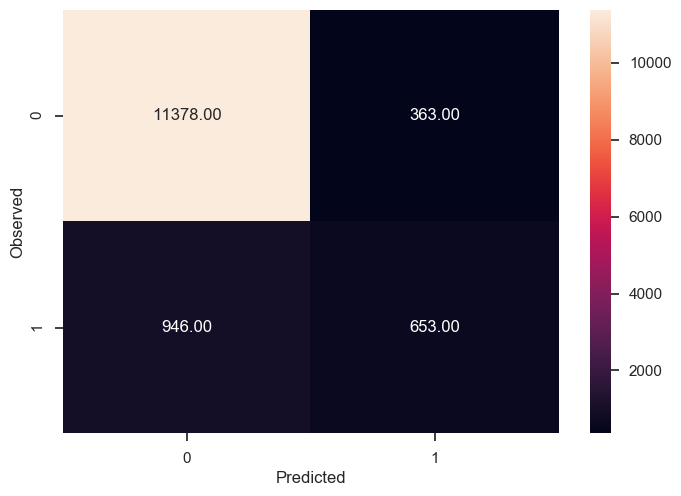

None

Recall: 0.4083802376485303

Precision: 0.6427165354330708

F1 Score: 0.49942638623326957

Roc Auc Score: 0.6887314696461713

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.97      0.95     11741
           1       0.64      0.41      0.50      1599

    accuracy                           0.90     13340
   macro avg       0.78      0.69      0.72     13340
weighted avg       0.89      0.90      0.89     13340



In [126]:
#Bagging metrics
print('Bagging Metrics:')
print()
PrintMetrics('Bagging',bgcl,bgclPredict)

In [127]:
from sklearn.ensemble import AdaBoostClassifier
abcl = AdaBoostClassifier(n_estimators=10, random_state=1)
abcl = abcl.fit(x_train, y_train)
abclPredict = abcl.predict(x_test)

AdaBoost Metrics:

Training accuracy : 0.8935937801195142

Testing accuracy: 0.895

Confusion Matrix


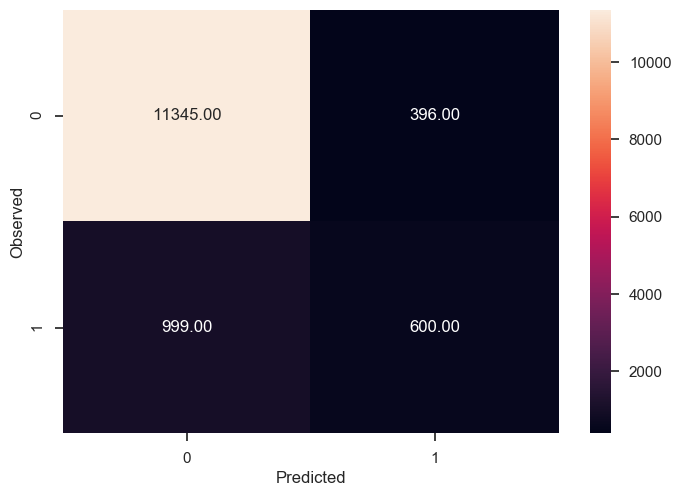

None

Recall: 0.37523452157598497

Precision: 0.6024096385542169

F1 Score: 0.4624277456647399

Roc Auc Score: 0.6707532798664355

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.97      0.94     11741
           1       0.60      0.38      0.46      1599

    accuracy                           0.90     13340
   macro avg       0.76      0.67      0.70     13340
weighted avg       0.88      0.90      0.88     13340



In [128]:
#AdaBoost metrics
print('AdaBoost Metrics:')
print()
PrintMetrics('AdaBoost',abcl,abclPredict)

In [129]:
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(n_estimators = 50,random_state=1)
gbcl = gbcl.fit(x_train, y_train)
gbclPredict = gbcl.predict(x_test)

GradientBoosting Metrics:

Training accuracy : 0.9066054102679432

Testing accuracy: 0.903

Confusion Matrix


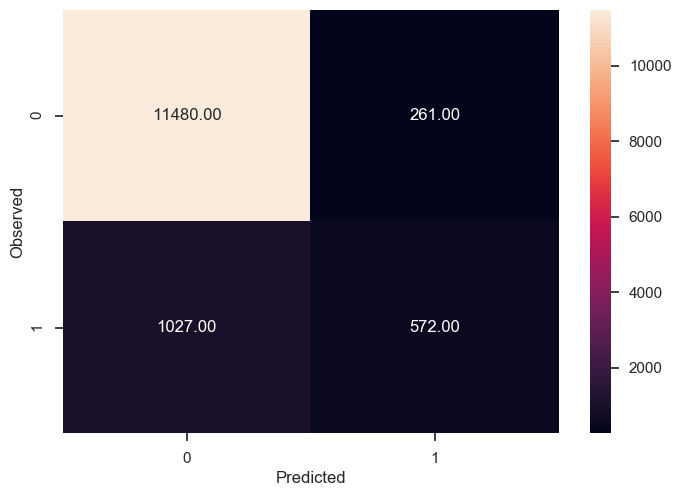

None

Recall: 0.35772357723577236

Precision: 0.6866746698679472

F1 Score: 0.47039473684210525

Roc Auc Score: 0.6677468921014054

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.98      0.95     11741
           1       0.69      0.36      0.47      1599

    accuracy                           0.90     13340
   macro avg       0.80      0.67      0.71     13340
weighted avg       0.89      0.90      0.89     13340



In [130]:
#GradientBoosting metrics
print('GradientBoosting Metrics:')
print()
PrintMetrics('GradientBoosting',gbcl,gbclPredict)

# Conclusion
Make a DataFrame to compare models and their metrics. Give conclusion regarding the best algorithm and your reason behind it. (5 marks)


In [131]:
L = list(item for item in range(1,6))

In [132]:
df = pd.DataFrame(columns = ['Algorithm Name', 'Training accuracy', 'Testing accuracy','Recall','Precision','F1 Score','Roc Auc Score'],index=L) 

In [133]:
df['Algorithm Name'] = pd.Series(algo_names, index=df.index)
df['Training accuracy'] = pd.Series(train_scores, index=df.index)
df['Testing accuracy'] = pd.Series(test_scores, index=df.index)
df['Recall'] = pd.Series(recall_scores, index=df.index)
df['Precision'] = pd.Series(precision_scores, index=df.index)
df['F1 Score'] = pd.Series(f1_scores, index=df.index)
df['Roc Auc Score'] = pd.Series(roc_auc_scores, index=df.index)



In [134]:
df

,Algorithm Name,Training accuracy,Testing accuracy,Recall,Precision,F1 Score,Roc Auc Score
1,LogisticRegression,0.893112,0.891,0.226391,0.626298,0.332568,0.603997
2,Decision Tree,1.000000,0.871,0.433396,0.458940,0.445803,0.681905
3,Bagging,0.999486,0.902,0.408380,0.642717,0.499426,0.688731
4,AdaBoost,0.893594,0.895,0.375235,0.602410,0.462428,0.670753
5,GradientBoosting,0.906605,0.903,0.357724,0.686675,0.470395,0.667747


Decision tree training accuracy is 1 but testing accuracy drops a lot. so it is overfitting data. Same is the case with Bagging. 

I think that GradientBoosting algorithm performs better compared to others as Training and Testing accuracy are approximately same. Precision score is best among all. We can also look at confusion matrix and classification report to compare. 

We have an imbalanced dataset where there are more negatives than positives(11%). To get more accurate result, we will have to change training data so that it will be more balanced. 